In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
import os
import joblib 

from sklearn.utils import class_weight # Added for class weights
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam
from tensorflow.python.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Ignore warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

print(f"TensorFlow Version: {tf.__version__}")

TensorFlow Version: 2.19.1


In [4]:
df = pd.read_csv("./Outputs/additional.csv", header = 0)
print(f"Original data shape: {df.shape}")
#Define features
features_cols = ['EAR','MAR','PITCH','YAW','ROLL','D_SLUMP','R_TILT']
target_col = 'LABEL'
#Seperate X and y
X = df[features_cols]
y= df[target_col]

#Check for Class Imbalance
print("\nClass Distribution:")
print(y.value_counts().sort_index())
# Mapping 0=Awake, 1=Sleep, 2=Yawning

Original data shape: (19601, 11)

Class Distribution:
LABEL
0    9068
1    5201
2    5332
Name: count, dtype: int64


In [5]:
# from imblearn.over_sampling import SMOTE
# # 1. Setup SMOTE
# # sampling_strategy='auto' resamples all classes to match the majority class
# smote = SMOTE(sampling_strategy='auto', random_state=42)

# # 2. Resample X and y
# print(f"Original shape: {X_scaled.shape}")
# X_resampled, y_resampled = smote.fit_resample(X_scaled, y)

# print(f"New shape after SMOTE: {X_resampled.shape}")
# print(pd.Series(y_resampled).value_counts())

In [6]:
# 1. Split Data
# 70% Train, 15% Val, 15% Test
X_train_raw, X_temp, y_train_raw, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
X_val_raw, X_test_raw, y_val_raw, y_test_raw = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# 2. Scale Features (MinMax is standard for these geometric features)
scaler = MinMaxScaler()

# FIT only on Training Data
X_train = scaler.fit_transform(X_train_raw)

# TRANSFORM Validation and Test Data (Do NOT fit on them)
X_val = scaler.transform(X_val_raw)
X_test = scaler.transform(X_test_raw)

# 3. SAVE THE SCALER
joblib.dump(scaler, 'scaler1.pkl')
print("\nScaler saved to 'scaler1.pkl'. COPY THIS FILE to your demo folder.")

# 4. One-Hot Encode Targets
num_classes = 3 

y_train = to_categorical(y_train_raw, num_classes=num_classes)
y_val = to_categorical(y_val_raw, num_classes=num_classes)
y_test = to_categorical(y_test_raw, num_classes=num_classes)

print(f"\nTrain shape: {X_train.shape}")
print(f"Val shape:   {X_val.shape}")
print(f"Test shape:  {X_test.shape}")


Scaler saved to 'scaler1.pkl'. COPY THIS FILE to your demo folder.

Train shape: (13720, 7)
Val shape:   (2940, 7)
Test shape:  (2941, 7)


In [7]:
# Calculate weights based on your training data
y_integers = np.argmax(y_train, axis=1) # Convert back from one-hot for calculation

class_weights = class_weight.compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_integers),
    y=y_integers
)

# Convert to dictionary format required by Keras: {0: 1.0, 1: 5.2, ...}
class_weight_dict = dict(enumerate(class_weights))

print(f"Class Weights: {class_weight_dict}")

Class Weights: {0: 0.7205503912609632, 1: 1.2560651835576306, 2: 1.2254376563058236}


PLOT EVALUATION GRAPH

In [8]:
def plot_history(history):
    # Get all metrics that are NOT 'loss' or 'val_loss'
    # logical logic: if key is 'accuracy', 'recall', etc.
    metrics = [k for k in history.history.keys() if k not in ['loss', 'val_loss', 'lr']]
    # Filter out validation keys (e.g., 'val_accuracy') to avoid duplicates in the list
    metrics = [m for m in metrics if not m.startswith('val_')]
    
    # Create subplots: 1 for Loss + 1 for each extra metric
    num_plots = 1 + len(metrics)
    fig, axes = plt.subplots(1, num_plots, figsize=(6 * num_plots, 4))
    
    # If there's only 1 plot (rare), wrap it in list so we can index it
    if num_plots == 1: axes = [axes]

    # --- Plot 1: LOSS ---
    axes[0].plot(history.history['loss'], label='Train Loss')
    if 'val_loss' in history.history:
        axes[0].plot(history.history['val_loss'], label='Val Loss')
    axes[0].set_title('Model Loss')
    axes[0].set_ylabel('Loss')
    axes[0].set_xlabel('Epoch')
    axes[0].legend()
    axes[0].grid(True)

    # --- Plot 2+: Other Metrics (Accuracy, Recall, etc.) ---
    for i, metric in enumerate(metrics):
        ax = axes[i+1]
        ax.plot(history.history[metric], label=f'Train {metric.capitalize()}')
        
        val_key = f'val_{metric}'
        if val_key in history.history:
            ax.plot(history.history[val_key], label=f'Val {metric.capitalize()}')
        
        ax.set_title(f'Model {metric.capitalize()}')
        ax.set_ylabel(metric.capitalize())
        ax.set_xlabel('Epoch')
        ax.legend()
        ax.grid(True)

    plt.tight_layout()
    plt.show()

DEFINE MODEL BEFORE TRAINING

In [9]:
n_feature = X_train.shape[1]

def train_model(x_train, y_train, x_valid, y_valid,
                num_nodes, dropout_prob, lr, batch_size, epochs):
    # Build model (Classification architecture for your problem)
    # Note: Modified to use 'softmax' output for Classification as per your earlier cells
    nn_model = Sequential([
        Dense(num_nodes, activation='relu', input_shape=(n_feature,)),
        Dropout(dropout_prob),
        Dense(num_nodes, activation='relu'),
        Dropout(dropout_prob),
        Dense(num_classes, activation='softmax') # Use softmax for multi-class classification
    ])

    # Compile
    nn_model.compile(
        optimizer=Adam(learning_rate=lr),
        loss='categorical_crossentropy', # Use Cat Crossentropy for Classification
        metrics=['accuracy', tf.keras.metrics.Recall()]             # Monitor Accuracy
    )
    
    # Early Stopping
    early_stop = EarlyStopping(
        monitor='val_loss',       # what metric to watch
        patience=10,              # how many epochs to wait (reduced to 10 for faster iterating)
        restore_best_weights=True # revert to best weights
    )

    # Train
    history = nn_model.fit(
        x_train, y_train,
        validation_data=(x_valid, y_valid),
        epochs=epochs,
        batch_size=batch_size,
        callbacks=[early_stop],
        class_weight=class_weight_dict, # <--- ADD THIS LINE
        verbose=0 # Silent training
    )
    # Extract final metrics
    final_train_loss = history.history['loss'][-1]
    final_val_loss = history.history['val_loss'][-1]
    final_train_acc = history.history['accuracy'][-1]
    final_val_acc = history.history['val_accuracy'][-1]

    print(f"   -> Final Train Loss: {final_train_loss:.4f}, Acc: {final_train_acc:.4f}")
    print(f"   -> Final Val Loss:   {final_val_loss:.4f}, Acc: {final_val_acc:.4f}")

    return nn_model, history

print("Training functions defined.")

Training functions defined.


INITIATE TRAINING

Starting Grid Search on 72 combinations...

[1/72] Testing: Nodes=16 | Dropout=0 | LR=0.01 | Batch=16
   -> Final Train Loss: 0.2867, Acc: 0.9009
   -> Final Val Loss:   0.3310, Acc: 0.8939


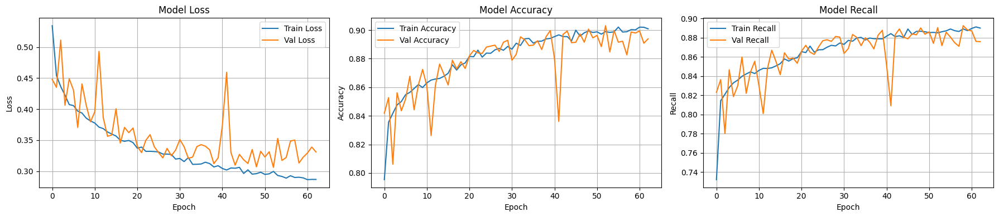

Validation Loss = 0.3062
least val_loss = 0.3062
   *** NEW BEST MODEL FOUND *** (Val Loss: 0.3062)


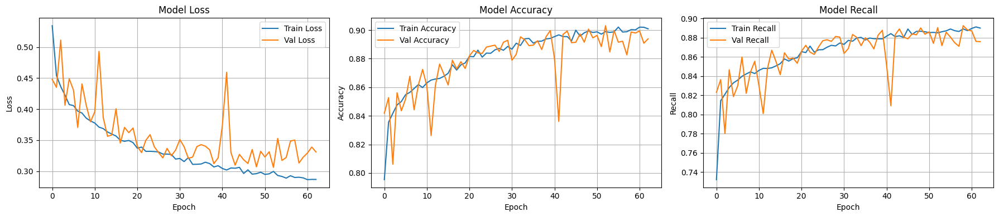


[2/72] Testing: Nodes=16 | Dropout=0 | LR=0.01 | Batch=32
   -> Final Train Loss: 0.2918, Acc: 0.8995
   -> Final Val Loss:   0.3172, Acc: 0.8935


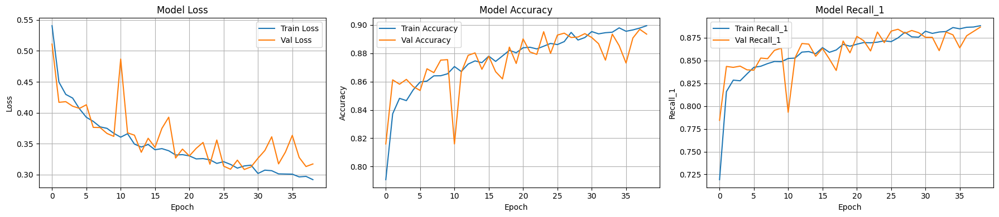

Validation Loss = 0.3083

[3/72] Testing: Nodes=16 | Dropout=0 | LR=0.01 | Batch=64
   -> Final Train Loss: 0.2563, Acc: 0.9090
   -> Final Val Loss:   0.2778, Acc: 0.9058


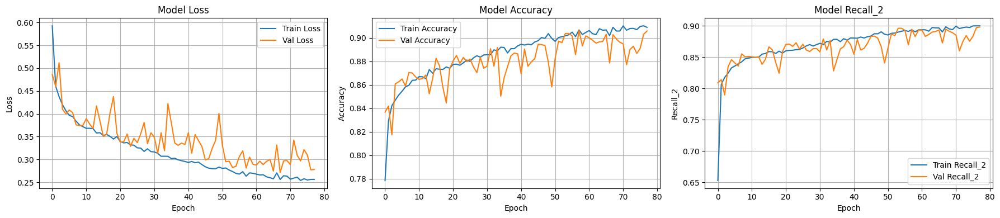

Validation Loss = 0.2713
least val_loss = 0.2713
   *** NEW BEST MODEL FOUND *** (Val Loss: 0.2713)


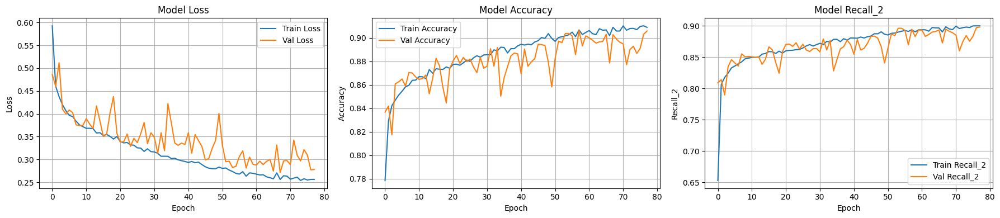


[4/72] Testing: Nodes=16 | Dropout=0 | LR=0.005 | Batch=16
   -> Final Train Loss: 0.3221, Acc: 0.8843
   -> Final Val Loss:   0.3319, Acc: 0.8837


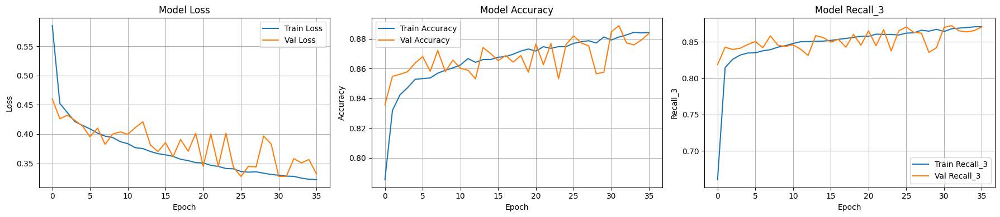

Validation Loss = 0.3275

[5/72] Testing: Nodes=16 | Dropout=0 | LR=0.005 | Batch=32
   -> Final Train Loss: 0.2888, Acc: 0.8958
   -> Final Val Loss:   0.3105, Acc: 0.8946


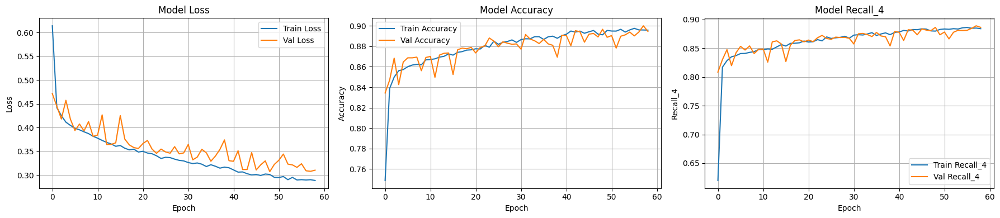

Validation Loss = 0.3075

[6/72] Testing: Nodes=16 | Dropout=0 | LR=0.005 | Batch=64
   -> Final Train Loss: 0.3064, Acc: 0.8918
   -> Final Val Loss:   0.3672, Acc: 0.8772


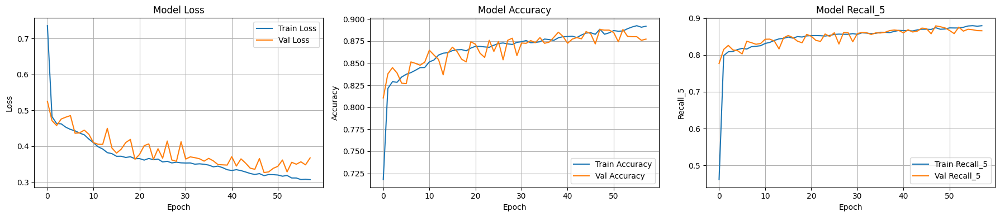

Validation Loss = 0.3263

[7/72] Testing: Nodes=16 | Dropout=0 | LR=0.001 | Batch=16
   -> Final Train Loss: 0.2897, Acc: 0.8982
   -> Final Val Loss:   0.3234, Acc: 0.8918


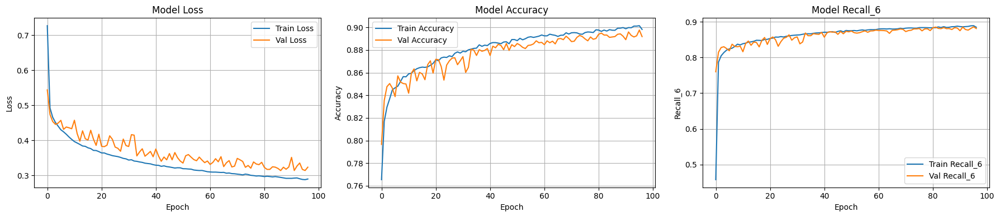

Validation Loss = 0.3137

[8/72] Testing: Nodes=16 | Dropout=0 | LR=0.001 | Batch=32
   -> Final Train Loss: 0.3272, Acc: 0.8829
   -> Final Val Loss:   0.3530, Acc: 0.8755


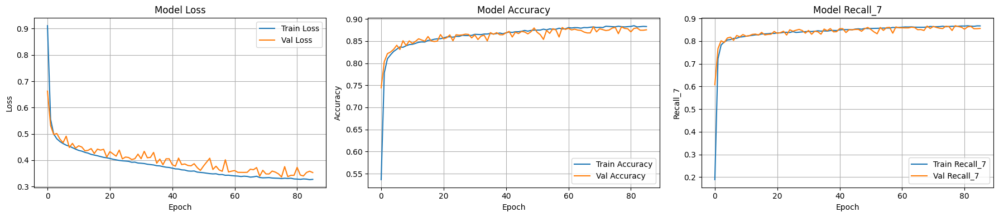

Validation Loss = 0.3362

[9/72] Testing: Nodes=16 | Dropout=0 | LR=0.001 | Batch=64
   -> Final Train Loss: 0.3322, Acc: 0.8789
   -> Final Val Loss:   0.3558, Acc: 0.8735


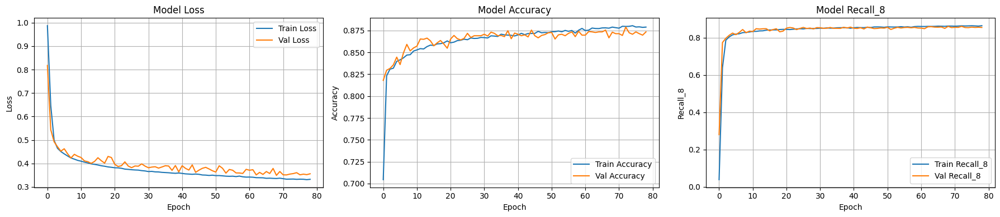

Validation Loss = 0.3490

[10/72] Testing: Nodes=16 | Dropout=0.2 | LR=0.01 | Batch=16
   -> Final Train Loss: 0.4329, Acc: 0.8500
   -> Final Val Loss:   0.3788, Acc: 0.8697


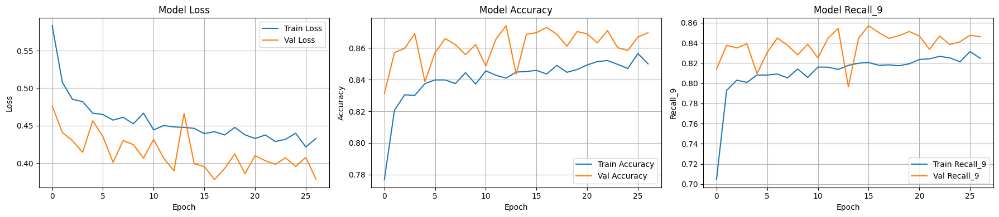

Validation Loss = 0.3780

[11/72] Testing: Nodes=16 | Dropout=0.2 | LR=0.01 | Batch=32
   -> Final Train Loss: 0.4455, Acc: 0.8490
   -> Final Val Loss:   0.4097, Acc: 0.8660


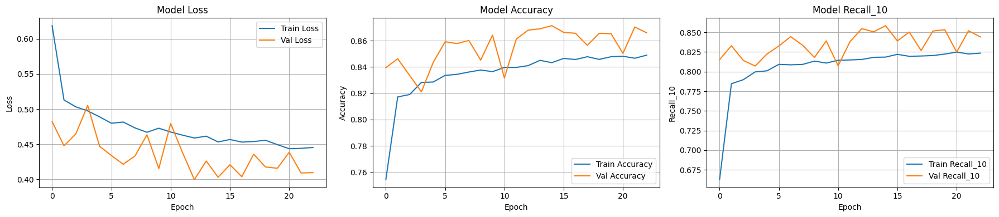

Validation Loss = 0.3997

[12/72] Testing: Nodes=16 | Dropout=0.2 | LR=0.01 | Batch=64
   -> Final Train Loss: 0.4164, Acc: 0.8527
   -> Final Val Loss:   0.3708, Acc: 0.8704


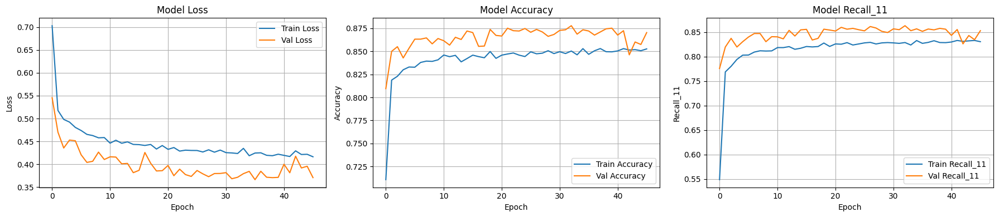

Validation Loss = 0.3664

[13/72] Testing: Nodes=16 | Dropout=0.2 | LR=0.005 | Batch=16
   -> Final Train Loss: 0.4378, Acc: 0.8457
   -> Final Val Loss:   0.3883, Acc: 0.8673


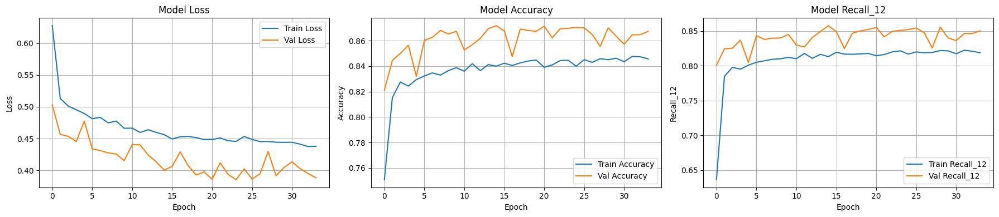

Validation Loss = 0.3853

[14/72] Testing: Nodes=16 | Dropout=0.2 | LR=0.005 | Batch=32
   -> Final Train Loss: 0.4242, Acc: 0.8520
   -> Final Val Loss:   0.4008, Acc: 0.8622


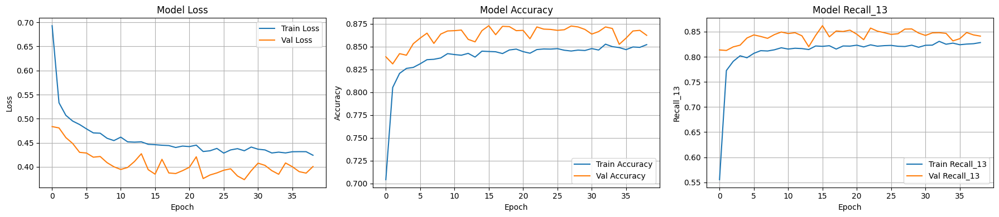

Validation Loss = 0.3736

[15/72] Testing: Nodes=16 | Dropout=0.2 | LR=0.005 | Batch=64
   -> Final Train Loss: 0.4386, Acc: 0.8473
   -> Final Val Loss:   0.3879, Acc: 0.8656


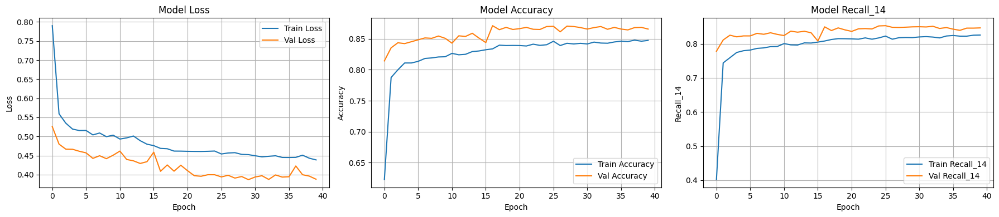

Validation Loss = 0.3869

[16/72] Testing: Nodes=16 | Dropout=0.2 | LR=0.001 | Batch=16
   -> Final Train Loss: 0.4468, Acc: 0.8434
   -> Final Val Loss:   0.3874, Acc: 0.8694


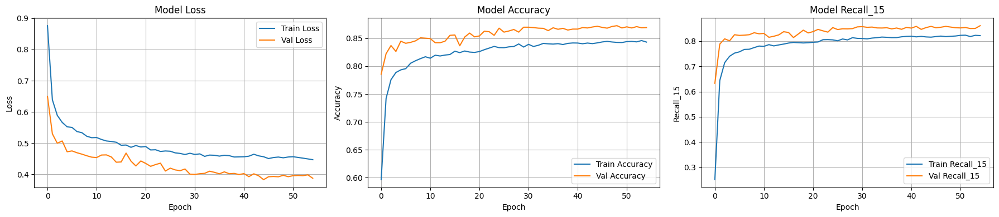

Validation Loss = 0.3829

[17/72] Testing: Nodes=16 | Dropout=0.2 | LR=0.001 | Batch=32
   -> Final Train Loss: 0.3969, Acc: 0.8609
   -> Final Val Loss:   0.3707, Acc: 0.8701


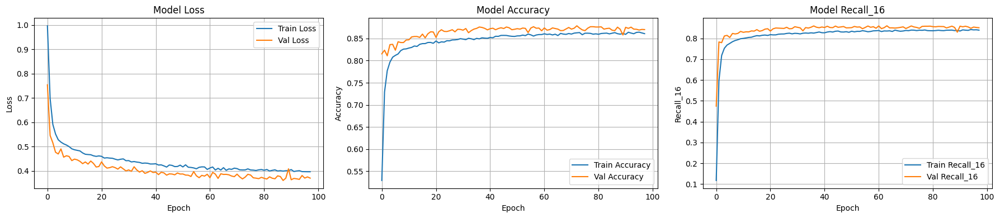

Validation Loss = 0.3610

[18/72] Testing: Nodes=16 | Dropout=0.2 | LR=0.001 | Batch=64
   -> Final Train Loss: 0.4243, Acc: 0.8516
   -> Final Val Loss:   0.3955, Acc: 0.8704


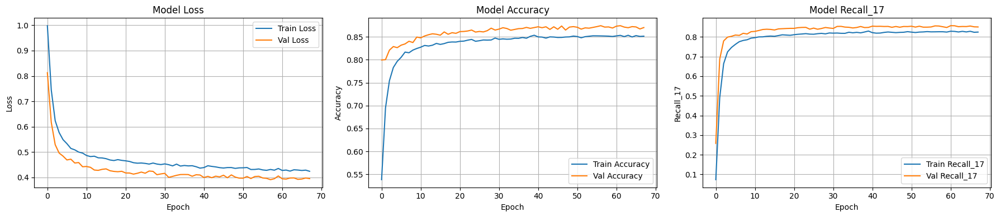

Validation Loss = 0.3914

[19/72] Testing: Nodes=32 | Dropout=0 | LR=0.01 | Batch=16
   -> Final Train Loss: 0.2179, Acc: 0.9218
   -> Final Val Loss:   0.2423, Acc: 0.9160


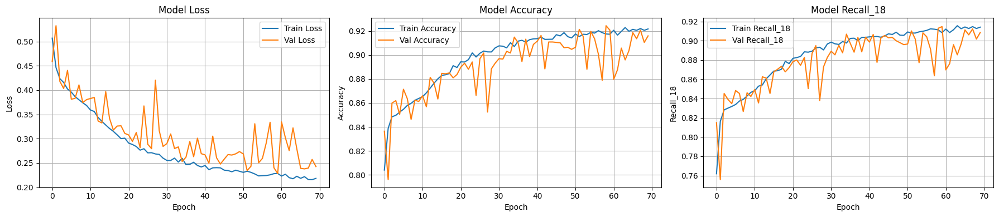

Validation Loss = 0.2277
least val_loss = 0.2277
   *** NEW BEST MODEL FOUND *** (Val Loss: 0.2277)


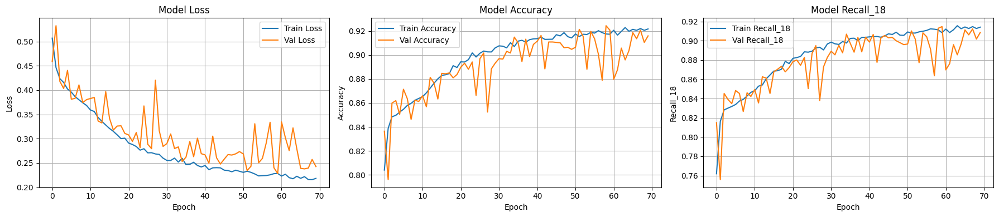


[20/72] Testing: Nodes=32 | Dropout=0 | LR=0.01 | Batch=32
   -> Final Train Loss: 0.2298, Acc: 0.9164
   -> Final Val Loss:   0.2697, Acc: 0.9082


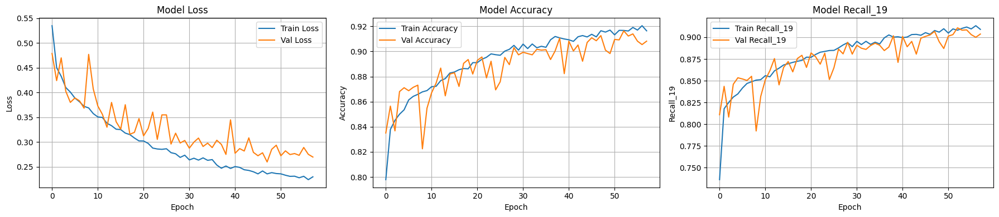

Validation Loss = 0.2597

[21/72] Testing: Nodes=32 | Dropout=0 | LR=0.01 | Batch=64
   -> Final Train Loss: 0.2026, Acc: 0.9284
   -> Final Val Loss:   0.2438, Acc: 0.9224


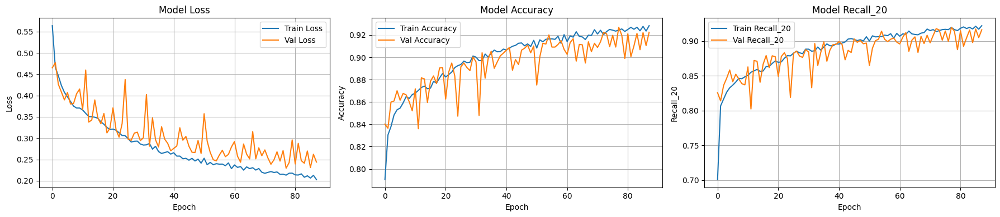

Validation Loss = 0.2295

[22/72] Testing: Nodes=32 | Dropout=0 | LR=0.005 | Batch=16
   -> Final Train Loss: 0.2031, Acc: 0.9281
   -> Final Val Loss:   0.2565, Acc: 0.9122


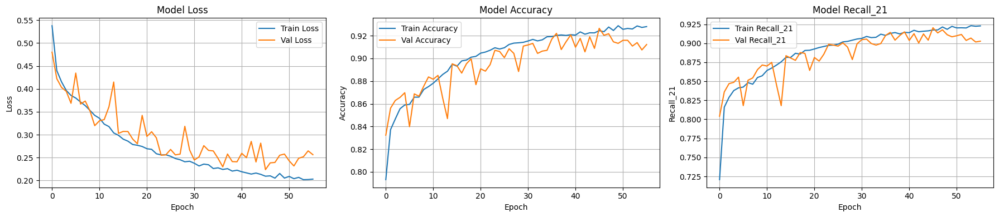

Validation Loss = 0.2238
least val_loss = 0.2238
   *** NEW BEST MODEL FOUND *** (Val Loss: 0.2238)


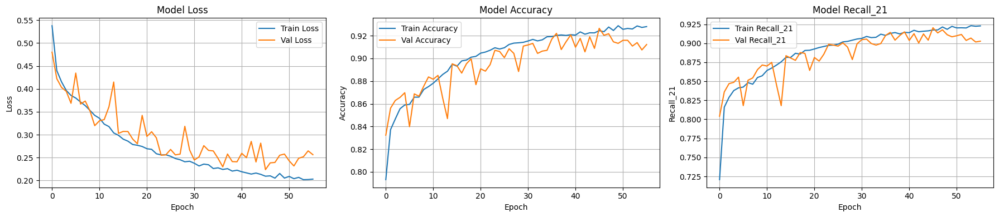


[23/72] Testing: Nodes=32 | Dropout=0 | LR=0.005 | Batch=32
   -> Final Train Loss: 0.1908, Acc: 0.9316
   -> Final Val Loss:   0.2700, Acc: 0.9184


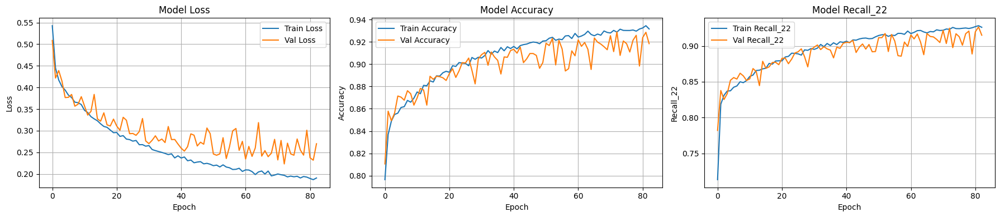

Validation Loss = 0.2233
least val_loss = 0.2233
   *** NEW BEST MODEL FOUND *** (Val Loss: 0.2233)


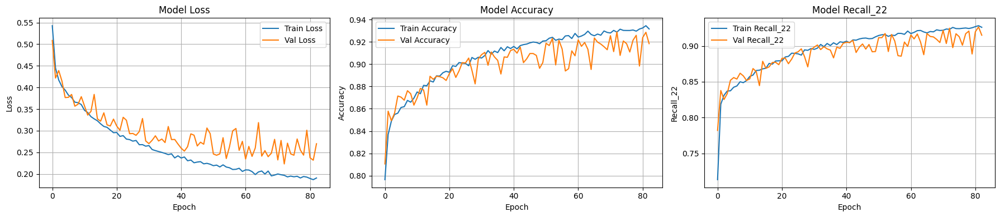


[24/72] Testing: Nodes=32 | Dropout=0 | LR=0.005 | Batch=64
   -> Final Train Loss: 0.2371, Acc: 0.9175
   -> Final Val Loss:   0.3157, Acc: 0.8966


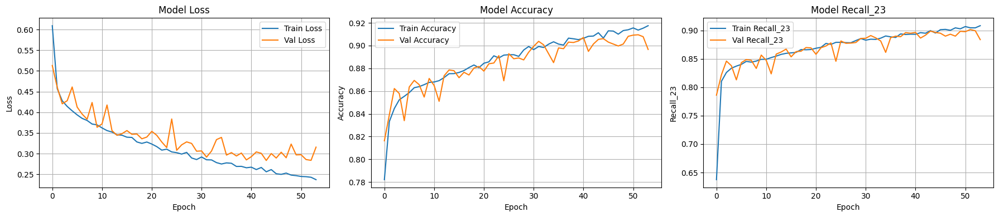

Validation Loss = 0.2835

[25/72] Testing: Nodes=32 | Dropout=0 | LR=0.001 | Batch=16
   -> Final Train Loss: 0.2056, Acc: 0.9258
   -> Final Val Loss:   0.2623, Acc: 0.9075


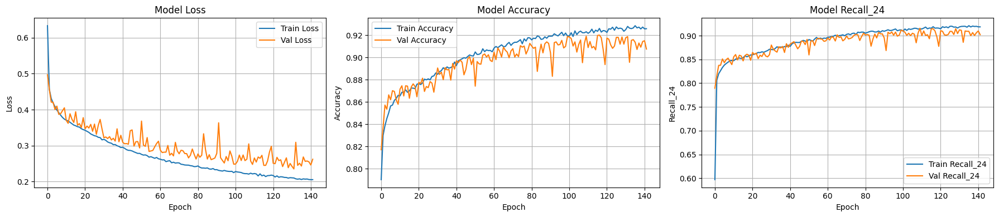

Validation Loss = 0.2354

[26/72] Testing: Nodes=32 | Dropout=0 | LR=0.001 | Batch=32
   -> Final Train Loss: 0.3156, Acc: 0.8872
   -> Final Val Loss:   0.3477, Acc: 0.8816


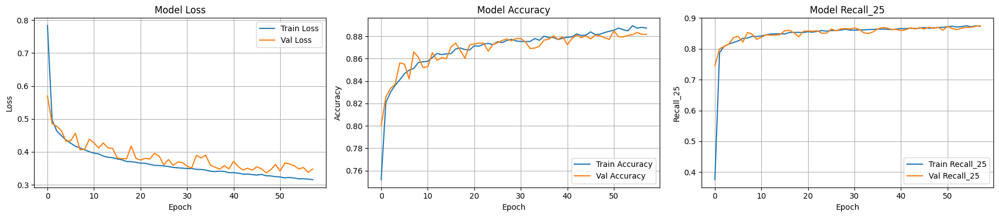

Validation Loss = 0.3363

[27/72] Testing: Nodes=32 | Dropout=0 | LR=0.001 | Batch=64
   -> Final Train Loss: 0.3108, Acc: 0.8875
   -> Final Val Loss:   0.3326, Acc: 0.8813


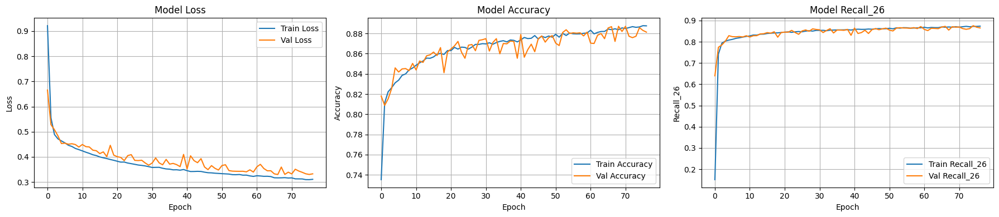

Validation Loss = 0.3298

[28/72] Testing: Nodes=32 | Dropout=0.2 | LR=0.01 | Batch=16
   -> Final Train Loss: 0.3892, Acc: 0.8644
   -> Final Val Loss:   0.3520, Acc: 0.8762


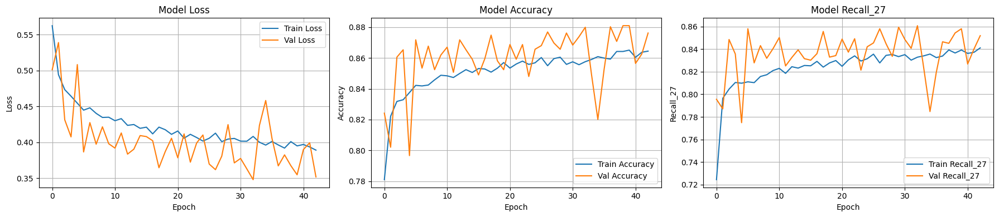

Validation Loss = 0.3481

[29/72] Testing: Nodes=32 | Dropout=0.2 | LR=0.01 | Batch=32
   -> Final Train Loss: 0.3546, Acc: 0.8699
   -> Final Val Loss:   0.3279, Acc: 0.8871


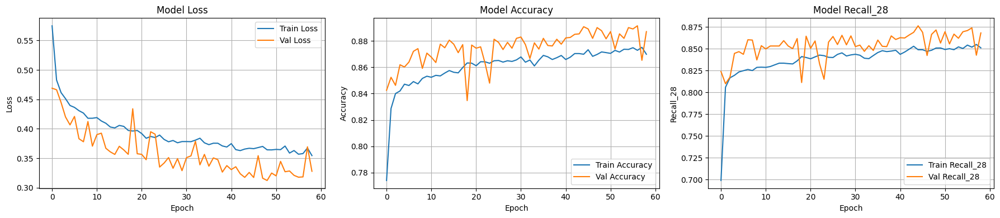

Validation Loss = 0.3123

[30/72] Testing: Nodes=32 | Dropout=0.2 | LR=0.01 | Batch=64
   -> Final Train Loss: 0.3519, Acc: 0.8747
   -> Final Val Loss:   0.3478, Acc: 0.8816


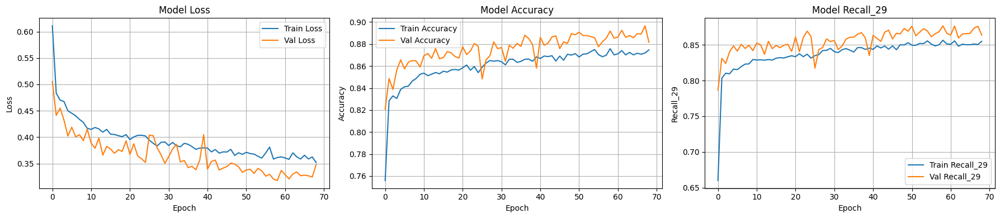

Validation Loss = 0.3179

[31/72] Testing: Nodes=32 | Dropout=0.2 | LR=0.005 | Batch=16
   -> Final Train Loss: 0.3353, Acc: 0.8839
   -> Final Val Loss:   0.2908, Acc: 0.9007


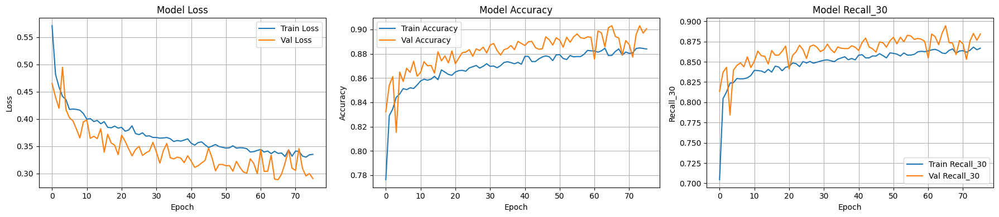

Validation Loss = 0.2889

[32/72] Testing: Nodes=32 | Dropout=0.2 | LR=0.005 | Batch=32
   -> Final Train Loss: 0.3650, Acc: 0.8714
   -> Final Val Loss:   0.3827, Acc: 0.8629


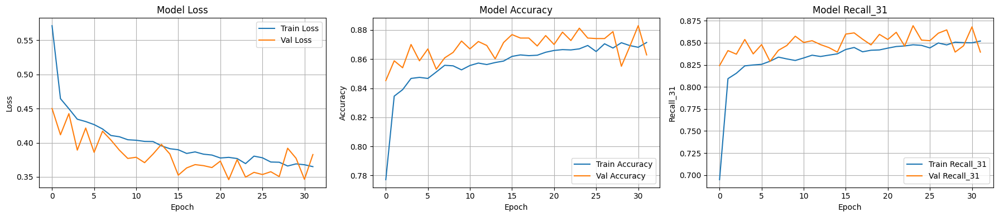

Validation Loss = 0.3459

[33/72] Testing: Nodes=32 | Dropout=0.2 | LR=0.005 | Batch=64
   -> Final Train Loss: 0.3212, Acc: 0.8882
   -> Final Val Loss:   0.2952, Acc: 0.8973


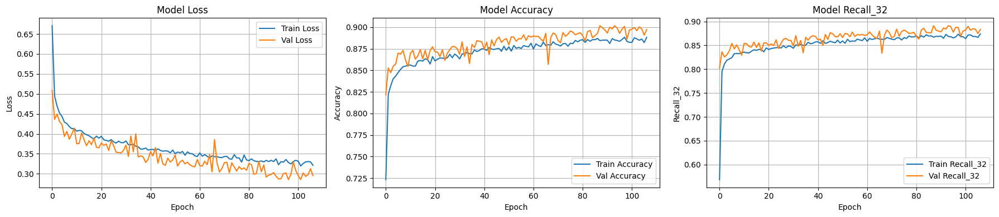

Validation Loss = 0.2852

[34/72] Testing: Nodes=32 | Dropout=0.2 | LR=0.001 | Batch=16
   -> Final Train Loss: 0.3322, Acc: 0.8789
   -> Final Val Loss:   0.3080, Acc: 0.8898


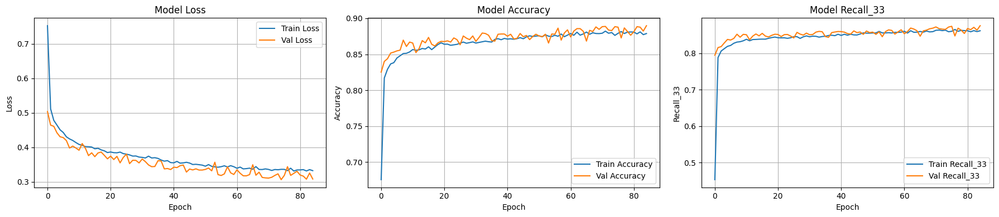

Validation Loss = 0.3062

[35/72] Testing: Nodes=32 | Dropout=0.2 | LR=0.001 | Batch=32
   -> Final Train Loss: 0.3201, Acc: 0.8859
   -> Final Val Loss:   0.2995, Acc: 0.8980


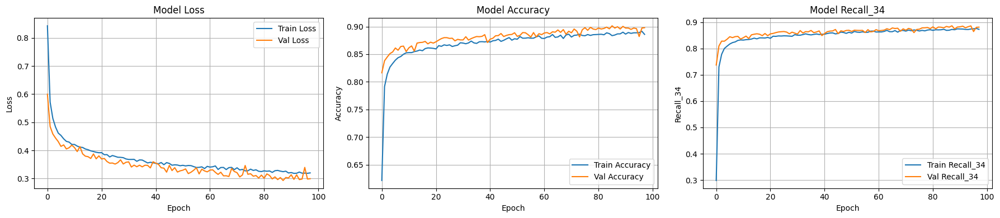

Validation Loss = 0.2931

[36/72] Testing: Nodes=32 | Dropout=0.2 | LR=0.001 | Batch=64
   -> Final Train Loss: 0.3353, Acc: 0.8829
   -> Final Val Loss:   0.3190, Acc: 0.8799


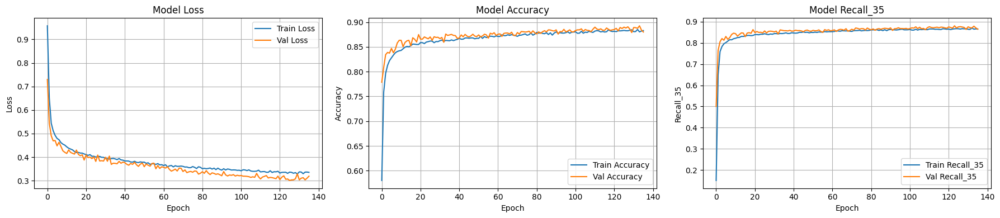

Validation Loss = 0.3007

[37/72] Testing: Nodes=64 | Dropout=0 | LR=0.01 | Batch=16
   -> Final Train Loss: 0.1872, Acc: 0.9347
   -> Final Val Loss:   0.2429, Acc: 0.9221


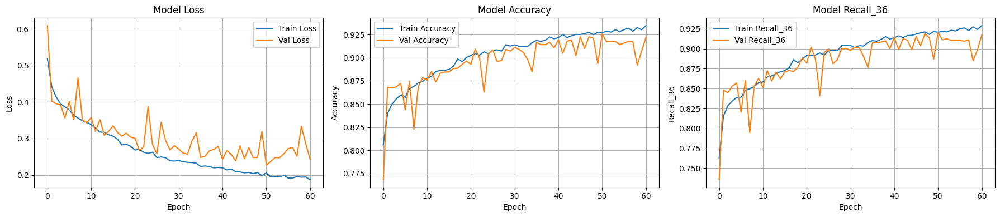

Validation Loss = 0.2271

[38/72] Testing: Nodes=64 | Dropout=0 | LR=0.01 | Batch=32
   -> Final Train Loss: 0.2282, Acc: 0.9188
   -> Final Val Loss:   0.3095, Acc: 0.8939


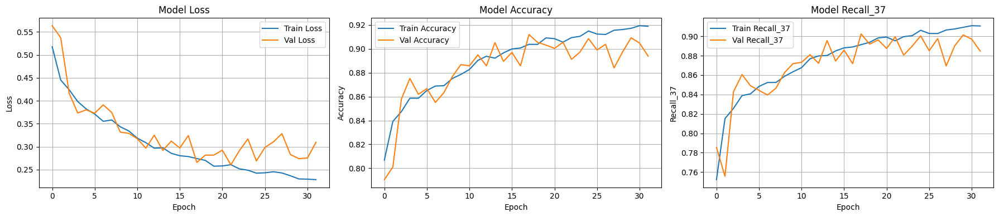

Validation Loss = 0.2605

[39/72] Testing: Nodes=64 | Dropout=0 | LR=0.01 | Batch=64
   -> Final Train Loss: 0.1949, Acc: 0.9289
   -> Final Val Loss:   0.2443, Acc: 0.9163


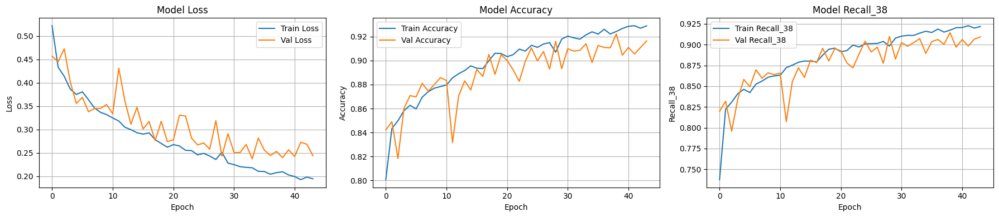

Validation Loss = 0.2375

[40/72] Testing: Nodes=64 | Dropout=0 | LR=0.005 | Batch=16
   -> Final Train Loss: 0.1693, Acc: 0.9362
   -> Final Val Loss:   0.2131, Acc: 0.9337


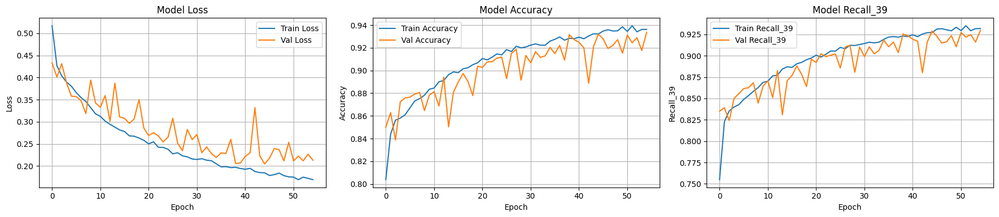

Validation Loss = 0.2047
least val_loss = 0.2047
   *** NEW BEST MODEL FOUND *** (Val Loss: 0.2047)


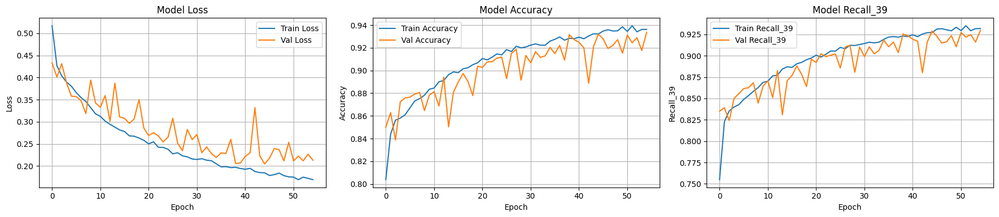


[41/72] Testing: Nodes=64 | Dropout=0 | LR=0.005 | Batch=32
   -> Final Train Loss: 0.1448, Acc: 0.9459
   -> Final Val Loss:   0.1887, Acc: 0.9306


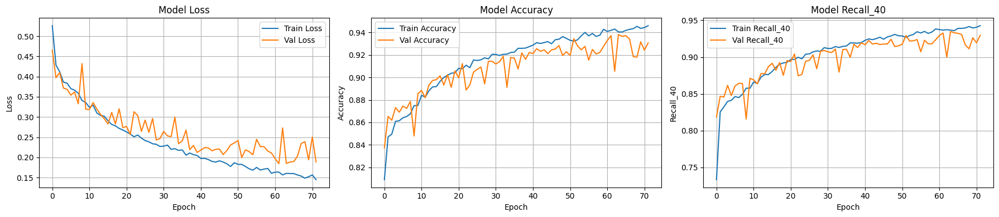

Validation Loss = 0.1846
least val_loss = 0.1846
   *** NEW BEST MODEL FOUND *** (Val Loss: 0.1846)


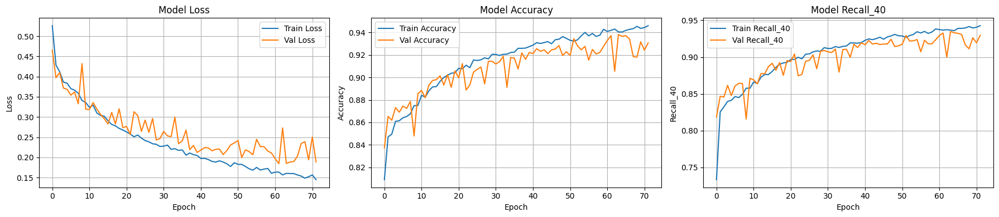


[42/72] Testing: Nodes=64 | Dropout=0 | LR=0.005 | Batch=64
   -> Final Train Loss: 0.1478, Acc: 0.9475
   -> Final Val Loss:   0.2013, Acc: 0.9350


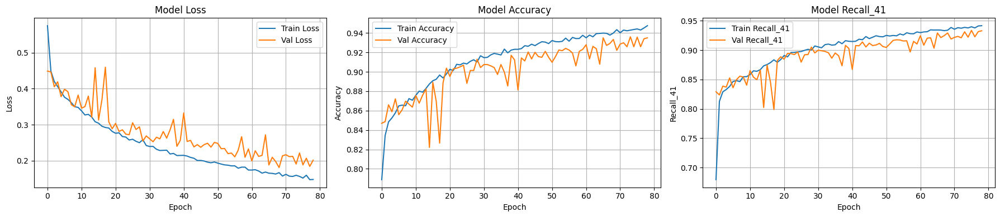

Validation Loss = 0.1809
least val_loss = 0.1809
   *** NEW BEST MODEL FOUND *** (Val Loss: 0.1809)


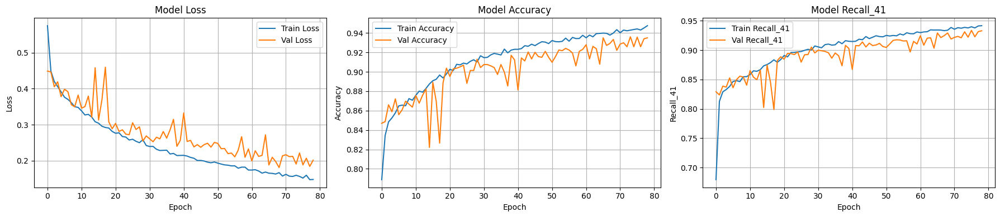


[43/72] Testing: Nodes=64 | Dropout=0 | LR=0.001 | Batch=16
   -> Final Train Loss: 0.1769, Acc: 0.9371
   -> Final Val Loss:   0.2367, Acc: 0.9259


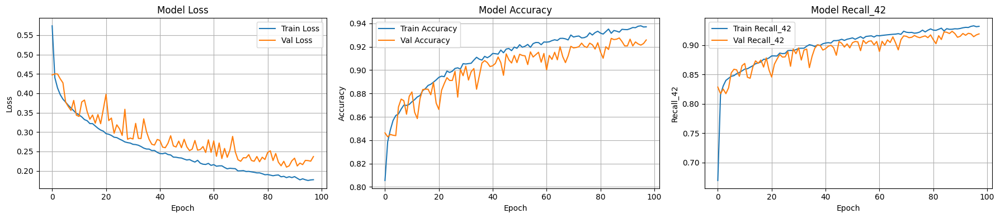

Validation Loss = 0.2094

[44/72] Testing: Nodes=64 | Dropout=0 | LR=0.001 | Batch=32
   -> Final Train Loss: 0.2327, Acc: 0.9197
   -> Final Val Loss:   0.2755, Acc: 0.9054


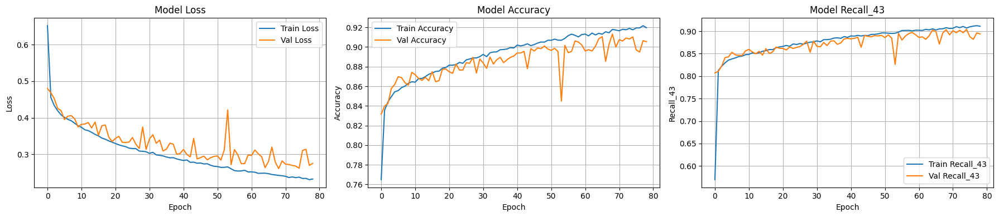

Validation Loss = 0.2613

[45/72] Testing: Nodes=64 | Dropout=0 | LR=0.001 | Batch=64
   -> Final Train Loss: 0.2261, Acc: 0.9195
   -> Final Val Loss:   0.2480, Acc: 0.9082


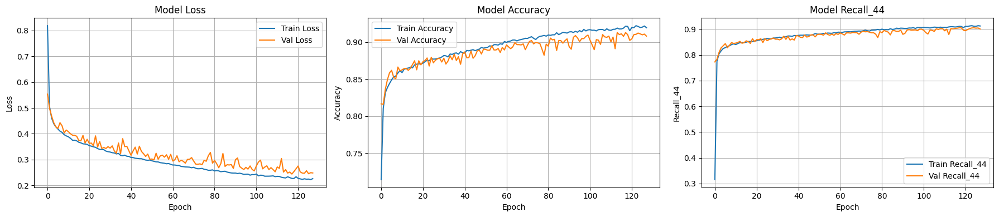

Validation Loss = 0.2439

[46/72] Testing: Nodes=64 | Dropout=0.2 | LR=0.01 | Batch=16
   -> Final Train Loss: 0.3627, Acc: 0.8720
   -> Final Val Loss:   0.3475, Acc: 0.8810


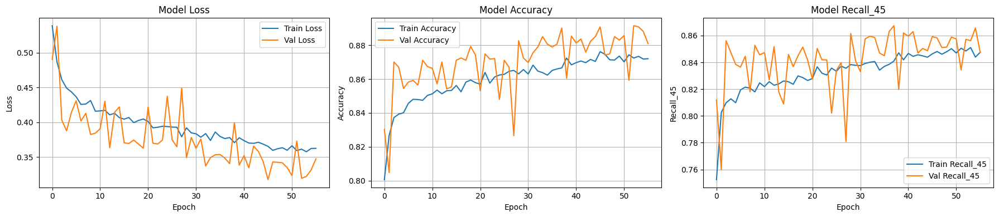

Validation Loss = 0.3176

[47/72] Testing: Nodes=64 | Dropout=0.2 | LR=0.01 | Batch=32
   -> Final Train Loss: 0.3211, Acc: 0.8881
   -> Final Val Loss:   0.2893, Acc: 0.9027


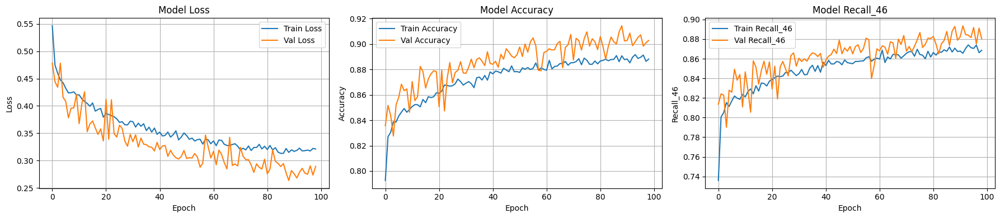

Validation Loss = 0.2634

[48/72] Testing: Nodes=64 | Dropout=0.2 | LR=0.01 | Batch=64
   -> Final Train Loss: 0.3032, Acc: 0.8886
   -> Final Val Loss:   0.2937, Acc: 0.8939


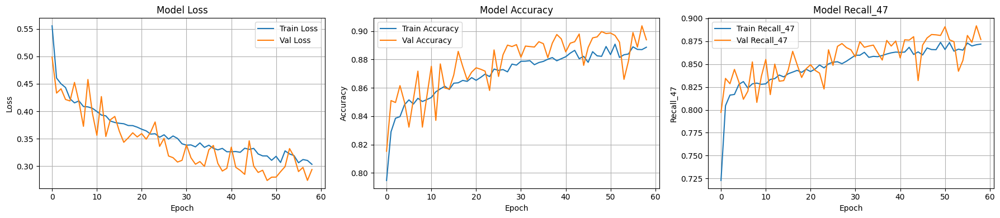

Validation Loss = 0.2737

[49/72] Testing: Nodes=64 | Dropout=0.2 | LR=0.005 | Batch=16
   -> Final Train Loss: 0.2674, Acc: 0.9057
   -> Final Val Loss:   0.2403, Acc: 0.9133


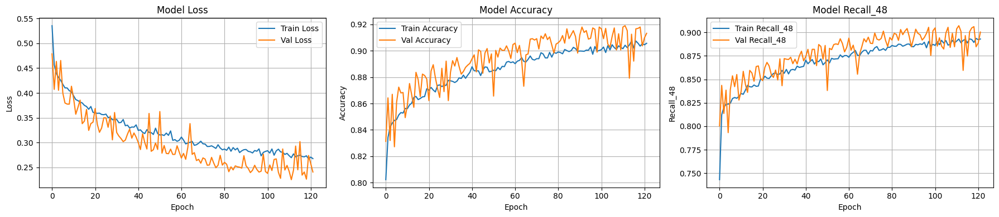

Validation Loss = 0.2249

[50/72] Testing: Nodes=64 | Dropout=0.2 | LR=0.005 | Batch=32
   -> Final Train Loss: 0.3069, Acc: 0.8938
   -> Final Val Loss:   0.3167, Acc: 0.8816


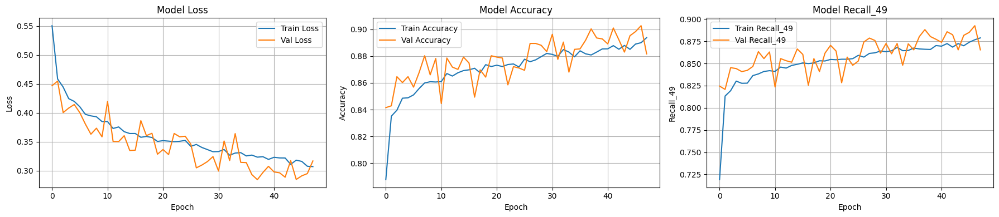

Validation Loss = 0.2844

[51/72] Testing: Nodes=64 | Dropout=0.2 | LR=0.005 | Batch=64
   -> Final Train Loss: 0.2533, Acc: 0.9102
   -> Final Val Loss:   0.2424, Acc: 0.9150


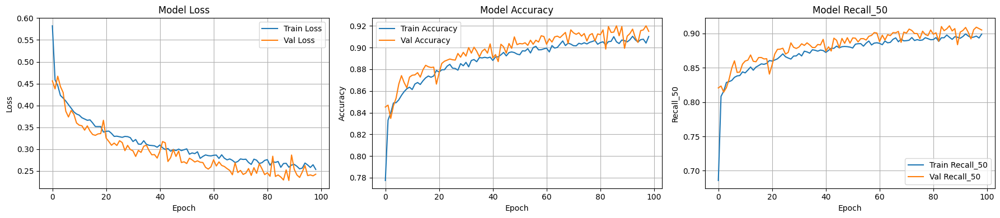

Validation Loss = 0.2280

[52/72] Testing: Nodes=64 | Dropout=0.2 | LR=0.001 | Batch=16
   -> Final Train Loss: 0.2379, Acc: 0.9152
   -> Final Val Loss:   0.2336, Acc: 0.9163


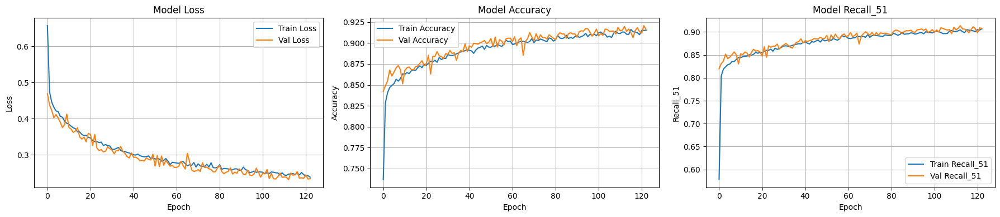

Validation Loss = 0.2310

[53/72] Testing: Nodes=64 | Dropout=0.2 | LR=0.001 | Batch=32
   -> Final Train Loss: 0.2570, Acc: 0.9095
   -> Final Val Loss:   0.2433, Acc: 0.9143


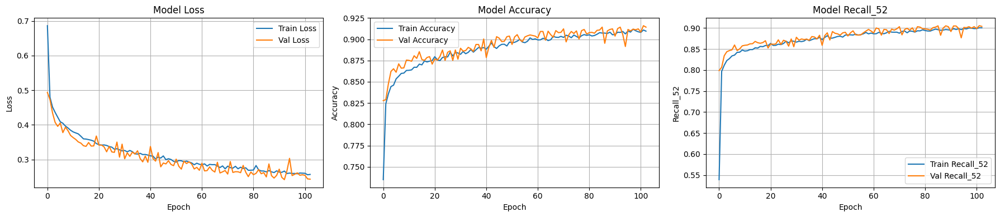

Validation Loss = 0.2418

[54/72] Testing: Nodes=64 | Dropout=0.2 | LR=0.001 | Batch=64
   -> Final Train Loss: 0.2770, Acc: 0.8999
   -> Final Val Loss:   0.2826, Acc: 0.9007


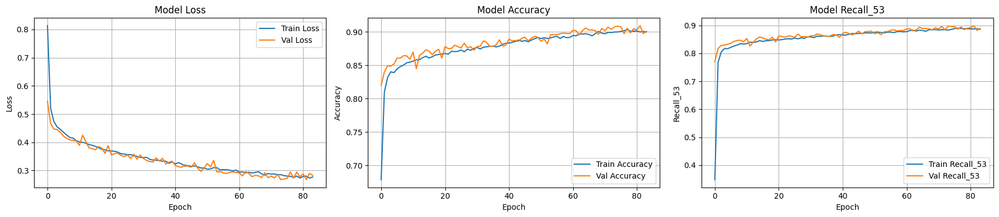

Validation Loss = 0.2676

[55/72] Testing: Nodes=128 | Dropout=0 | LR=0.01 | Batch=16
   -> Final Train Loss: 0.2434, Acc: 0.9103
   -> Final Val Loss:   0.3513, Acc: 0.8789


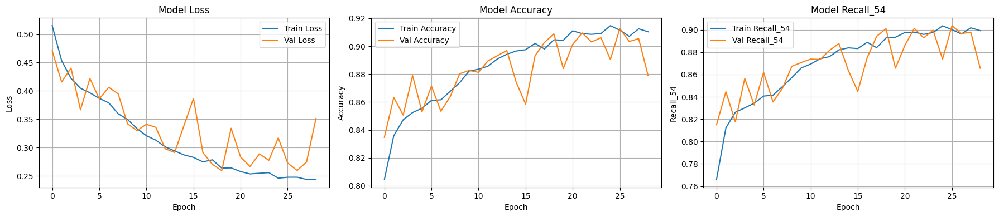

Validation Loss = 0.2593

[56/72] Testing: Nodes=128 | Dropout=0 | LR=0.01 | Batch=32
   -> Final Train Loss: 0.1563, Acc: 0.9413
   -> Final Val Loss:   0.2277, Acc: 0.9299


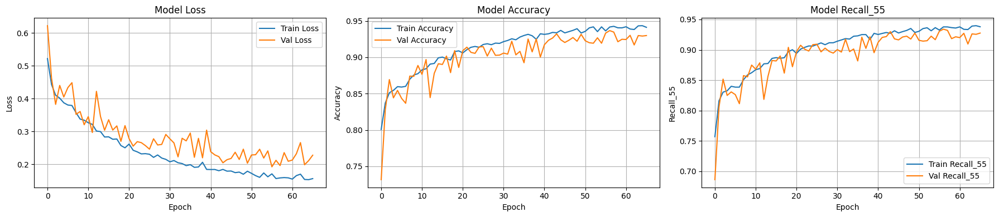

Validation Loss = 0.1923

[57/72] Testing: Nodes=128 | Dropout=0 | LR=0.01 | Batch=64
   -> Final Train Loss: 0.1367, Acc: 0.9503
   -> Final Val Loss:   0.1771, Acc: 0.9384


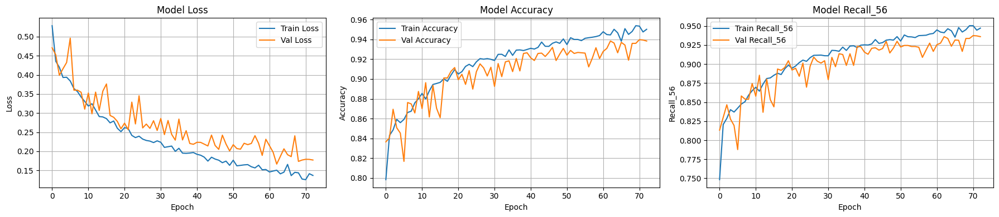

Validation Loss = 0.1664
least val_loss = 0.1664
   *** NEW BEST MODEL FOUND *** (Val Loss: 0.1664)


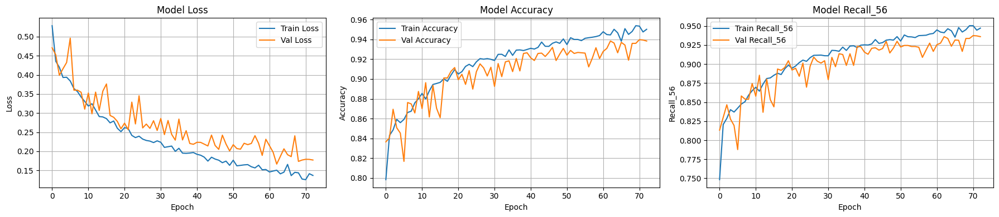


[58/72] Testing: Nodes=128 | Dropout=0 | LR=0.005 | Batch=16
   -> Final Train Loss: 0.1629, Acc: 0.9429
   -> Final Val Loss:   0.2650, Acc: 0.9139


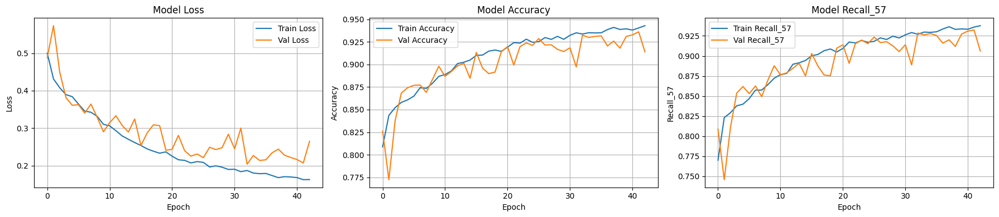

Validation Loss = 0.2039

[59/72] Testing: Nodes=128 | Dropout=0 | LR=0.005 | Batch=32
   -> Final Train Loss: 0.1377, Acc: 0.9522
   -> Final Val Loss:   0.2151, Acc: 0.9272


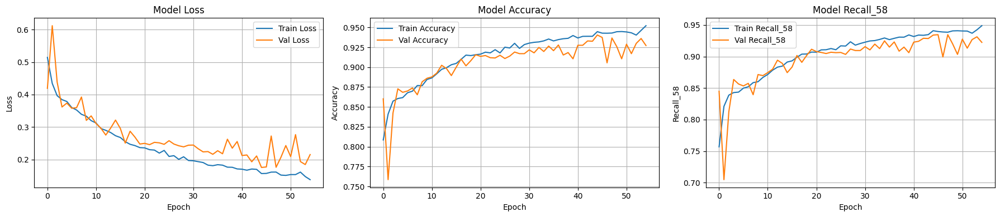

Validation Loss = 0.1754

[60/72] Testing: Nodes=128 | Dropout=0 | LR=0.005 | Batch=64
   -> Final Train Loss: 0.1439, Acc: 0.9476
   -> Final Val Loss:   0.2449, Acc: 0.9126


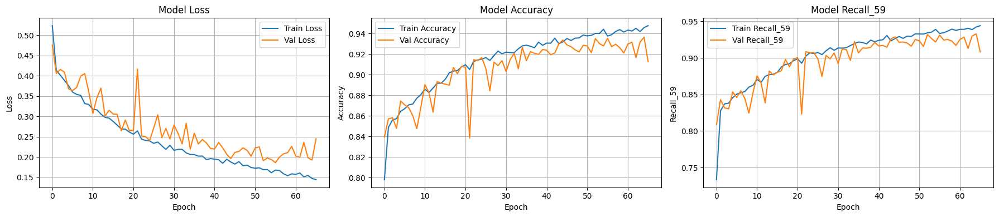

Validation Loss = 0.1858

[61/72] Testing: Nodes=128 | Dropout=0 | LR=0.001 | Batch=16
   -> Final Train Loss: 0.1488, Acc: 0.9458
   -> Final Val Loss:   0.1959, Acc: 0.9323


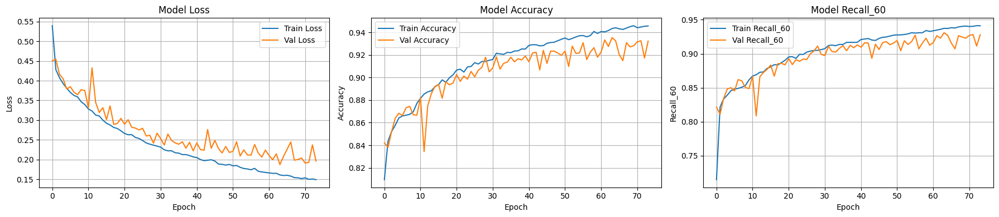

Validation Loss = 0.1870

[62/72] Testing: Nodes=128 | Dropout=0 | LR=0.001 | Batch=32
   -> Final Train Loss: 0.1364, Acc: 0.9520
   -> Final Val Loss:   0.1837, Acc: 0.9367


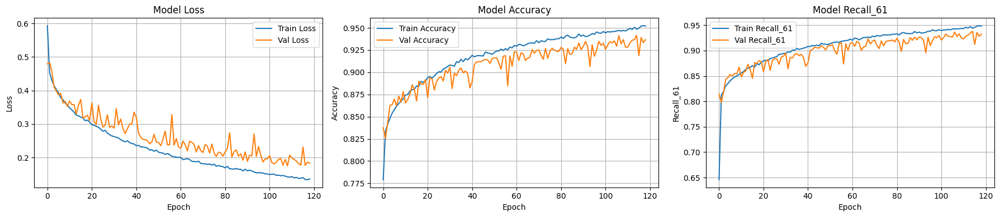

Validation Loss = 0.1755

[63/72] Testing: Nodes=128 | Dropout=0 | LR=0.001 | Batch=64
   -> Final Train Loss: 0.1485, Acc: 0.9472
   -> Final Val Loss:   0.1872, Acc: 0.9347


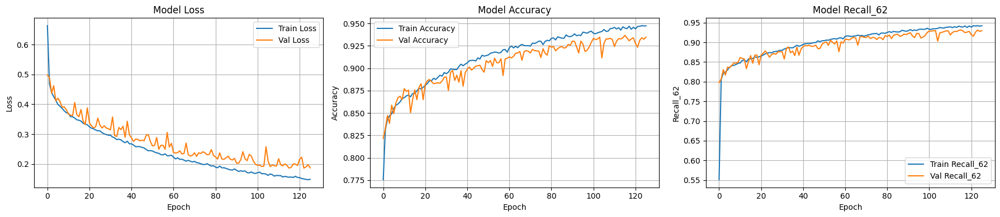

Validation Loss = 0.1862

[64/72] Testing: Nodes=128 | Dropout=0.2 | LR=0.01 | Batch=16
   -> Final Train Loss: 0.3602, Acc: 0.8725
   -> Final Val Loss:   0.3397, Acc: 0.8901


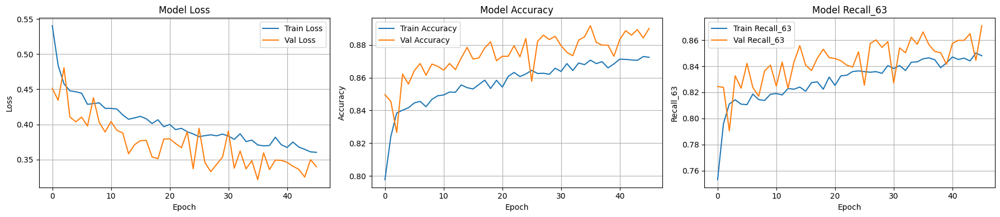

Validation Loss = 0.3214

[65/72] Testing: Nodes=128 | Dropout=0.2 | LR=0.01 | Batch=32
   -> Final Train Loss: 0.3675, Acc: 0.8676
   -> Final Val Loss:   0.3420, Acc: 0.8816


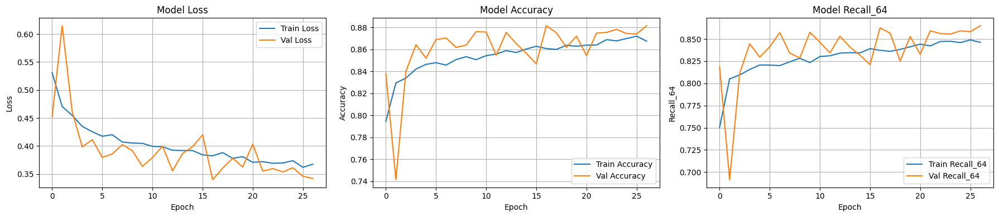

Validation Loss = 0.3399

[66/72] Testing: Nodes=128 | Dropout=0.2 | LR=0.01 | Batch=64
   -> Final Train Loss: 0.2972, Acc: 0.8933
   -> Final Val Loss:   0.3200, Acc: 0.8786


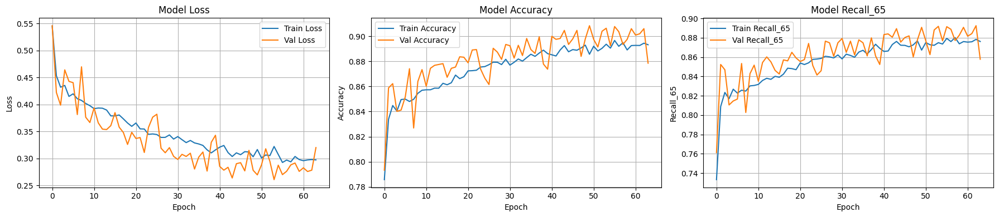

Validation Loss = 0.2606

[67/72] Testing: Nodes=128 | Dropout=0.2 | LR=0.005 | Batch=16
   -> Final Train Loss: 0.2766, Acc: 0.9046
   -> Final Val Loss:   0.2605, Acc: 0.9105


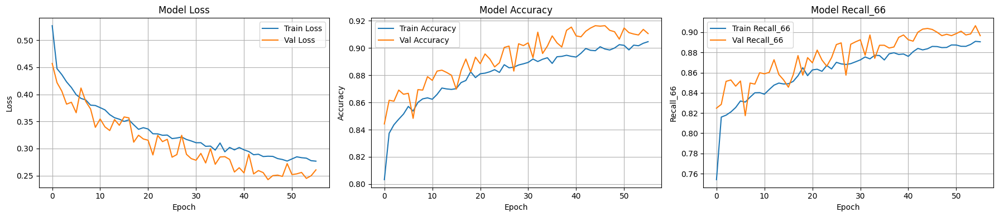

Validation Loss = 0.2424

[68/72] Testing: Nodes=128 | Dropout=0.2 | LR=0.005 | Batch=32
   -> Final Train Loss: 0.2445, Acc: 0.9112
   -> Final Val Loss:   0.2291, Acc: 0.9218


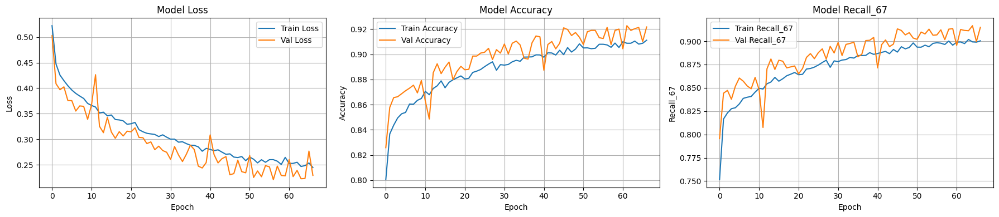

Validation Loss = 0.2207

[69/72] Testing: Nodes=128 | Dropout=0.2 | LR=0.005 | Batch=64
   -> Final Train Loss: 0.2149, Acc: 0.9240
   -> Final Val Loss:   0.2158, Acc: 0.9231


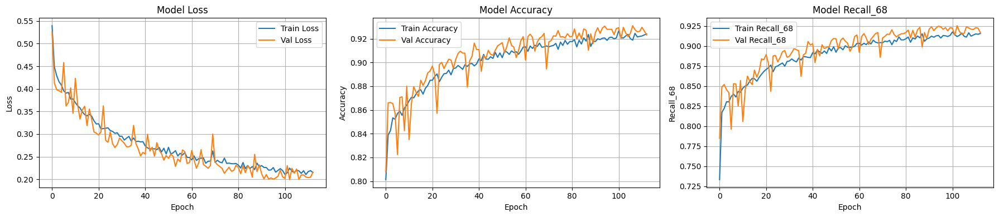

Validation Loss = 0.1992

[70/72] Testing: Nodes=128 | Dropout=0.2 | LR=0.001 | Batch=16
   -> Final Train Loss: 0.2135, Acc: 0.9244
   -> Final Val Loss:   0.2229, Acc: 0.9252


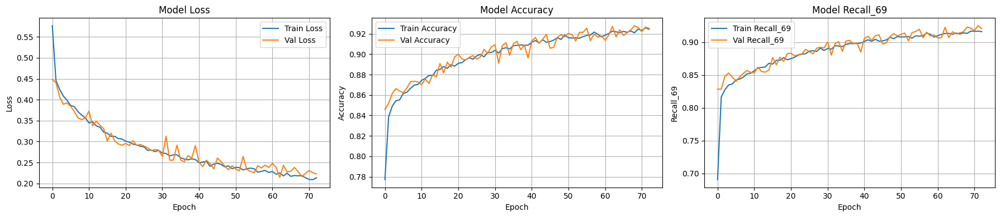

Validation Loss = 0.2146

[71/72] Testing: Nodes=128 | Dropout=0.2 | LR=0.001 | Batch=32
   -> Final Train Loss: 0.2033, Acc: 0.9248
   -> Final Val Loss:   0.2018, Acc: 0.9262


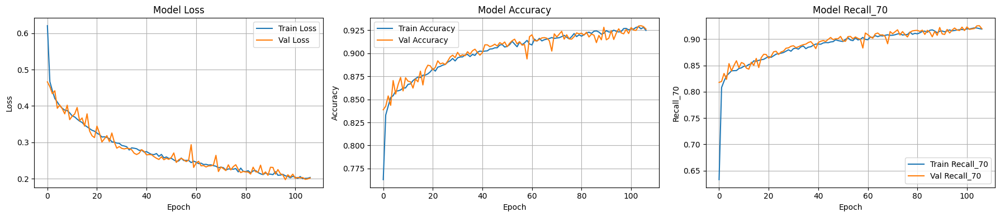

Validation Loss = 0.1972

[72/72] Testing: Nodes=128 | Dropout=0.2 | LR=0.001 | Batch=64
   -> Final Train Loss: 0.2135, Acc: 0.9227
   -> Final Val Loss:   0.2214, Acc: 0.9224


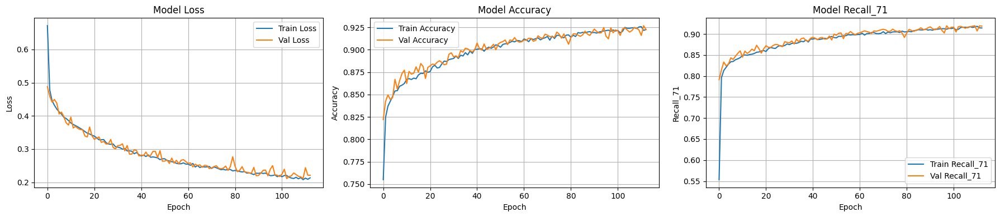

Validation Loss = 0.2113

Hyperparameter tuning complete.
Best Configuration: {'num_nodes': 128, 'dropout_prob': 0, 'learning_rate': 0.01, 'batch_size': 64, 'epochs': 73, 'val_loss': 0.16643}


In [10]:
least_val_loss = float('inf')
least_loss_model = None
best_nn_model_config = None
epochs = 150  # Set max epochs

# Search Grid
node_counts = [16, 32, 64, 128]
dropout_probs = [0, 0.2]
learning_rates = [0.01, 0.005, 0.001]
batch_sizes = [16, 32, 64]

total_runs = len(node_counts) * len(dropout_probs) * len(learning_rates) * len(batch_sizes)
current_run = 0

print(f"Starting Grid Search on {total_runs} combinations...")

for num_nodes in node_counts:
    for dropout_prob in dropout_probs:
        for lr in learning_rates:
            for batch_size in batch_sizes:
                current_run += 1
                print(f"\n[{current_run}/{total_runs}] Testing: Nodes={num_nodes} | Dropout={dropout_prob} | LR={lr} | Batch={batch_size}")
                
                # Call the train function
                model, history = train_model(
                    X_train, y_train,
                    X_val, y_val,
                    num_nodes, dropout_prob, lr, batch_size, epochs
                )

                # Optional: Plot history for every single model (can get spammy, maybe only plot best?)
                plot_history(history) 
                # Evaluate
                val_loss = model.evaluate(X_val, y_val, verbose=0)[0]
                print(f"Validation Loss = {val_loss:.4f}")

                if val_loss < least_val_loss:
                    least_val_loss = val_loss
                    least_loss_model = model
                    print(f"least val_loss = {least_val_loss:.4f}")
                    
                    best_nn_model_config = {
                        'num_nodes': num_nodes,
                        'dropout_prob': dropout_prob,
                        'learning_rate': lr,
                        'batch_size': batch_size,
                        'epochs': len(history.history['loss']), # Actual epochs run
                        'val_loss': round(val_loss, 5)
                    }
                       
                    print(f"   *** NEW BEST MODEL FOUND *** (Val Loss: {least_val_loss:.4f})")
                    # Plot the history only for new best models to save space65
                    plot_history(history)

print("\nHyperparameter tuning complete.")
print(f"Best Configuration: {best_nn_model_config}")

EVALUATE AND SAVE MODEL


--- Final Test Evaluation ---
Test Accuracy: 0.9466
Test Recall:   0.9432
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 993us/step

Classification Report:
              precision    recall  f1-score   support

   Awake (0)       0.95      0.96      0.95      1361
   Sleep (1)       0.94      0.98      0.96       780
 Yawning (2)       0.95      0.90      0.93       800

    accuracy                           0.95      2941
   macro avg       0.95      0.94      0.95      2941
weighted avg       0.95      0.95      0.95      2941



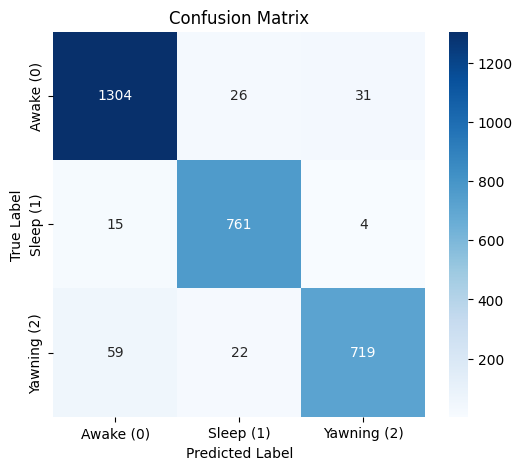

In [11]:
# 1. Evaluate on Test Set
print("\n--- Final Test Evaluation ---")
loss, acc, recall = least_loss_model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {acc:.4f}")
print(f"Test Recall:   {recall:.4f}")

# 2. Detailed Report
y_pred_probs = least_loss_model.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = np.argmax(y_test, axis=1)

class_names = ['Awake (0)', 'Sleep (1)', 'Yawning (2)']
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# 3. Confusion Matrix
plt.figure(figsize=(6, 5))
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix')
plt.show()

# 4. Save Model
least_loss_model.save("./model/best_drowsiness_model_1.keras")

with open("./model/best_drowsiness_model_config_1.json", "w") as f:
    json.dump(best_nn_model_config, f, indent = 4)

In [12]:
model_path = './Outputs/drowsiness_model.h5'
if os.path.exists(model_path):
    least_loss_model = tf.keras.models.load_model(model_path)
    print(f"Loaded model from {model_path}")
    least_loss_model.summary()
else:
    raise FileNotFoundError(f"Model file not found: {model_path}")

Loaded model from ./Outputs/drowsiness_model.h5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 28, 64)         │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 14, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 128)            │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 109,126 (426.28 KB)

 Trainable params: 109,124 (426.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2 (12.00 B)

In [ ]:
# 5. Extract Specific Metrics (Optional, for logging)
accuracy = accuracy_score(y_true, y_pred_classes)
# 'weighted' average accounts for class imbalance
precision = precision_score(y_true, y_pred_classes, average='weighted')
recall = recall_score(y_true, y_pred_classes, average='weighted')
f1 = f1_score(y_true, y_pred_classes, average='weighted')

print(f"\nOverall Accuracy:  {accuracy:.4f}")
print(f"Weighted Precision: {precision:.4f}")
print(f"Weighted Recall:    {recall:.4f}")
print(f"Weighted F1-Score:  {f1:.4f}")

ValueError: Exception encountered when calling Sequential.call().

[1mInvalid input shape for input Tensor("data:0", shape=(32, 10), dtype=float32). Expected shape (None, 30, 9), but input has incompatible shape (32, 10)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(32, 10), dtype=float32)
  • training=False
  • mask=None
  • kwargs=<class 'inspect._empty'>

In [14]:
# Check the counts of your final processed dataframe (before splitting)
# Assuming your target column is 'LABEL'
class_counts = df_clean['LABEL'].value_counts().sort_index()
print(class_counts)

plt.figure(figsize=(8,5))
sns.barplot(x=class_counts.index, y=class_counts.values, palette='viridis')
plt.title('Class Distribution')
plt.xlabel('Label (0=Awake, 1=Drowsy, etc.)')
plt.ylabel('Number of Samples')
plt.show()

NameError: name 'df_clean' is not defined

In [ ]:
least_loss_model.save("./model/best_drowsiness_model_1.keras")

with open("./model/best_drowsiness_model_config_1.json", "w") as f:
    json.dump(best_nn_model_config, f, indent = 4)

KeyError: 'Image_Path'

In [ ]:
model_path = './model/best_drowsiness_model_1.keras'
if os.path.exists(model_path):
    least_loss_model = tf.keras.models.load_model(model_path)
    print(f"Loaded model from {model_path}")
    least_loss_model.summary()
else:
    raise FileNotFoundError(f"Model file not found: {model_path}")

with open('./model/best_drowsiness_model_config_1.json', 'r') as f:
    cfg = json.load(f)

print(cfg)

In [15]:
# Inspect saved model and dataset shapes to plan reshaping
print('Model input shape:', getattr(least_loss_model, 'input_shape', 'N/A'))
print('Model output shape:', getattr(least_loss_model, 'output_shape', 'N/A'))
print('\nModel layers:')
for i, layer in enumerate(least_loss_model.layers):
    print(i, layer.__class__.__name__, getattr(layer, 'input_shape', None), getattr(layer, 'output_shape', None))

print('\nDataset feature shapes:')
try:
    print('X shape:', X.shape)
    print('X columns (first 50):', list(X.columns)[:50])
except Exception as e:
    print('Could not show X columns:', e)

print('X_train shape:', X_train.shape)
print('X_val shape:', X_val.shape)
print('X_test shape:', X_test.shape)
print('n_feature variable:', n_feature)

# Show a few rows of the raw dataframe to look for grouping identifiers (video, timestamp, subject)
print('\ndf columns (first 50):', list(df.columns)[:50])
display(df.head())

Model input shape: (None, 30, 9)
Model output shape: (None, 4)

Model layers:
0 Conv1D None None
1 MaxPooling1D None None
2 LSTM None None
3 Dropout None None
4 Dense None None
5 Dropout None None
6 Dense None None

Dataset feature shapes:
X shape: (19601, 7)
X columns (first 50): ['EAR', 'MAR', 'PITCH', 'YAW', 'ROLL', 'D_SLUMP', 'R_TILT']
X_train shape: (13720, 7)
X_val shape: (2940, 7)
X_test shape: (2941, 7)
n_feature variable: 7

df columns (first 50): ['EAR', 'MAR', 'PITCH', 'YAW', 'ROLL', 'D_SLUMP', 'R_TILT', 'FACIAL_DISPLAYED', 'POSE_DISPLAYED', 'LABEL', 'Image_Path']


,EAR,MAR,PITCH,YAW,ROLL,D_SLUMP,R_TILT,FACIAL_DISPLAYED,POSE_DISPLAYED,LABEL,Image_Path
0,0.2785,0.4412,-2.6455,11.9168,2.5120,1.1111,2.8964,1,1,0,c:\VGU_projects\Drowsiness_detector\AI_Drowsin...
1,0.2791,0.4248,-4.2061,11.1383,3.0210,1.1124,1.4815,1,1,0,c:\VGU_projects\Drowsiness_detector\AI_Drowsin...
2,0.2856,0.4238,-5.2691,7.7924,2.4668,1.1035,2.3441,1,1,0,c:\VGU_projects\Drowsiness_detector\AI_Drowsin...
3,0.2874,0.4255,-6.5367,8.3542,2.7100,1.1091,2.3238,1,1,0,c:\VGU_projects\Drowsiness_detector\AI_Drowsin...
4,0.2751,0.4528,-1.8395,11.5948,2.9875,1.1322,2.1580,1,1,0,c:\VGU_projects\Drowsiness_detector\AI_Drowsin...


In [ ]:
mylist = [1, 2, 1, 2, 1, 2, 1, 2, 1, 2]
pred_list = np.array(mylist)

pred_list_shaped = pred_list.reshape(1, 10) 

print(pred_list_shaped.shape)

In [ ]:
y_testing = least_loss_model.predict(pred_list_shaped)

y_testing_classes = np.argmax(y_testing, axis=1)

y_testing_classes

label_name = y_testing_classes

print(label_name)